**GANs using cross entropy loss and non saturating loss¶**

In [3]:
#Creating a generator to generate new mnist_fashion images

#downloading data
import tensorflow as tf
from tensorflow.keras.datasets import fashion_mnist
(x_train,y_train), (x_test,y_test) = fashion_mnist.load_data()

4422102/4422102 [==============================] - 0s 0us/step


In [4]:
import numpy as np
#merge training and testing data set
dataset = np.concatenate([x_train,x_test],axis=0)
#reshape data to [0,1]
dataset = np.expand_dims(dataset,-1).astype("float32")/255
batch_size = 64
dataset = np.reshape(dataset,(-1,28,28,1))

dataset = tf.data.Dataset.from_tensor_slices(dataset)

dataset = dataset.shuffle(buffer_size=1024).batch(batch_size)


In [5]:
from tensorflow import keras
from tensorflow.keras import layers
noise_dim=150

generator = keras.models.Sequential([
    keras.layers.InputLayer(input_shape=(noise_dim,)),
    layers.Dense(7*7*256),
    layers.Reshape(target_shape=(7,7,256)),
    layers.Conv2DTranspose(256,3,activation="LeakyReLU",strides=2,padding="same"),
    layers.Conv2DTranspose(128,3,activation="LeakyReLU",strides=2,padding="same"),
    layers.Conv2DTranspose(1,3,activation="sigmoid",padding="same"),
])
generator.summary()
discriminator = keras.models.Sequential([
    keras.layers.InputLayer(input_shape=(28,28,1)),
    layers.Conv2D(256,3,activation="relu",strides=2,padding="same"),
    layers.Conv2D(128,3,activation="relu",strides=2,padding="same"),
    layers.Flatten(),
    layers.Dense(64,activation= "relu"),
    layers.Dropout(0.2),
    layers.Dense(1,activation="sigmoid")
])
discriminator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 12544)             1894144   
                                                                 
 reshape (Reshape)           (None, 7, 7, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTr  (None, 14, 14, 256)       590080    
 anspose)                                                        
                                                                 
 conv2d_transpose_1 (Conv2D  (None, 28, 28, 128)       295040    
 Transpose)                                                      
                                                                 
 conv2d_transpose_2 (Conv2D  (None, 28, 28, 1)         1153      
 Transpose)                                                      
                                                        

In [6]:
#we'll use clones for the second training with non saturating loss
from tensorflow.keras.models import clone_model
generator_clone = clone_model(generator)
discriminator_clone = clone_model(discriminator)

for layer in generator_clone.layers:
    layer.trainable = False

for layer in discriminator_clone.layers:
    layer.trainable = False



In [7]:
optimizerG= keras.optimizers.Adam(learning_rate =0.00001, beta_1=0.5)
optimizerD= keras.optimizers.Adam(learning_rate =0.00003, beta_1=0.5)
optimizerG1= tf.keras.optimizers.legacy.Adam(learning_rate =0.00001, beta_1=0.5)
optimizerD1= tf.keras.optimizers.legacy.Adam(learning_rate =0.00001, beta_1=0.5)
#we will use binary cross entropy to define the loss function of the discriminator
lossFn = tf.losses.BinaryCrossentropy(from_logits=True)
#lossFn=tf.compat.v1.keras.metrics.BinaryAccuracy
# in order to accelerate training of the generator we'll use a non saturated cost function that help training
#the generator faster near 0

def Non_Saturating_loss(y_pred):
    epsilon = 1e-15  # Small constant to avoid log(0)
    loss = -tf.reduce_mean( tf.math.log( y_pred + epsilon))
    return loss

dAccMetric = tf.keras.metrics.BinaryAccuracy()
gAccMetric = tf.keras.metrics.BinaryAccuracy()

In [8]:
def trainDstep(data,discriminator,generator,optimizer):
    batch_size = tf.shape(data)[0]

    noise = tf.random.normal(shape = (batch_size,noise_dim))
    y_true = tf.concat(
    [tf.ones(batch_size,1),
    tf.zeros(batch_size,1)],axis=0)

    with tf.GradientTape() as tape:
        fake = generator(noise)
        x = tf.concat([data,fake],axis=0)
        y_pred=discriminator(x)
        discriminatorLoss = lossFn(y_true,y_pred)

    grads = tape.gradient(discriminatorLoss,discriminator.trainable_weights)
    optimizer.apply_gradients(zip(grads,discriminator.trainable_weights))

    dAccMetric.update_state(y_true,y_pred)

    return {
        "discriminator_loss": discriminatorLoss,
        "discriminator_accuracy": dAccMetric.result()
    }

def trainGstep(data,discriminator,generator,optimizer):
    batch_size = tf.shape(data)[0]
    noise = tf.random.normal(shape = (batch_size,noise_dim))
    y_true = tf.ones(batch_size,1)

    with tf.GradientTape() as tape:
        y_pred=discriminator(generator(noise))
        generatorLoss = lossFn(y_true,y_pred)

    grads = tape.gradient(generatorLoss,generator.trainable_weights)
    optimizer.apply_gradients(zip(grads,generator.trainable_weights))

    gAccMetric.update_state(y_true,y_pred)

    return {
        "generator_loss": generatorLoss,
        "generator_accuracy": gAccMetric.result()}


def trainGstep1(data,discriminator,generator,optimizer):
    batch_size = tf.shape(data)[0]
    noise = tf.random.normal(shape = (batch_size,noise_dim))
    #y_true = tf.ones(batch_size,1)

    with tf.GradientTape() as tape:
        y_pred=discriminator(generator(noise))
        generatorLoss = Non_Saturating_loss(y_pred)

    grads = tape.gradient(generatorLoss,generator.trainable_weights)
    optimizer.apply_gradients(zip(grads,generator.trainable_weights))

    #gAccMetric.update_state(y_true,y_pred)

    return {
        "generator_loss": generatorLoss}
        #"generator_accuracy": gAccMetric.result()}



In [9]:
from matplotlib import pyplot as plt

def plotImages(model):
    images = model(np.random.normal(size=(81,noise_dim)))
    plt.figure(figsize = (9,9))

    for i , image in enumerate(images):
        plt.subplot(9,9,i+1)
        plt.imshow(np.squeeze(image,-1),cmap="Greys_r")
        plt.axis=('off')
    plt.show()


E:0, Loss G0.6354, Loss D:0.6359,Acc G:% 4.1099, Acc D:%86.43


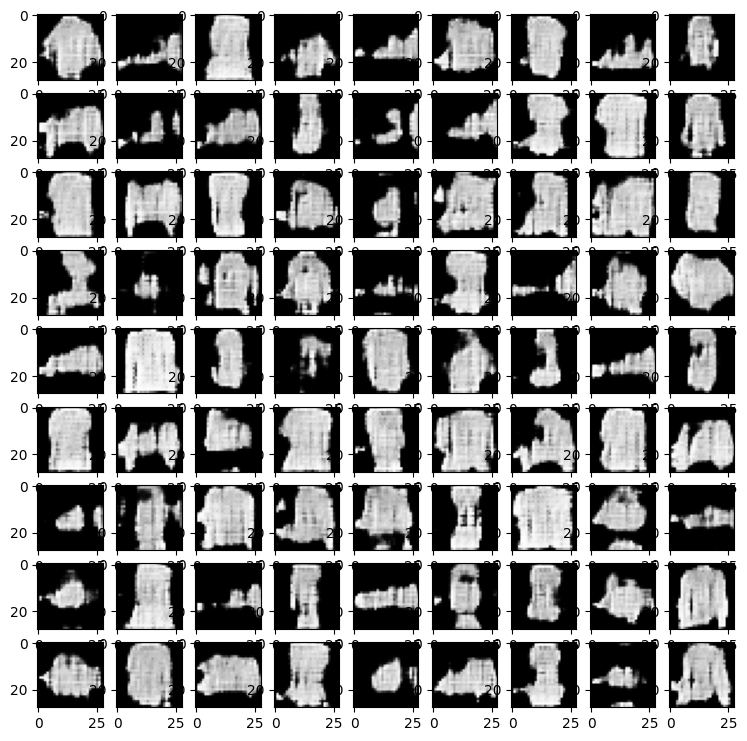

E:1, Loss G0.6382, Loss D:0.6342,Acc G:% 4.3102, Acc D:%85.01
E:2, Loss G0.6350, Loss D:0.6268,Acc G:% 4.4195, Acc D:%83.91


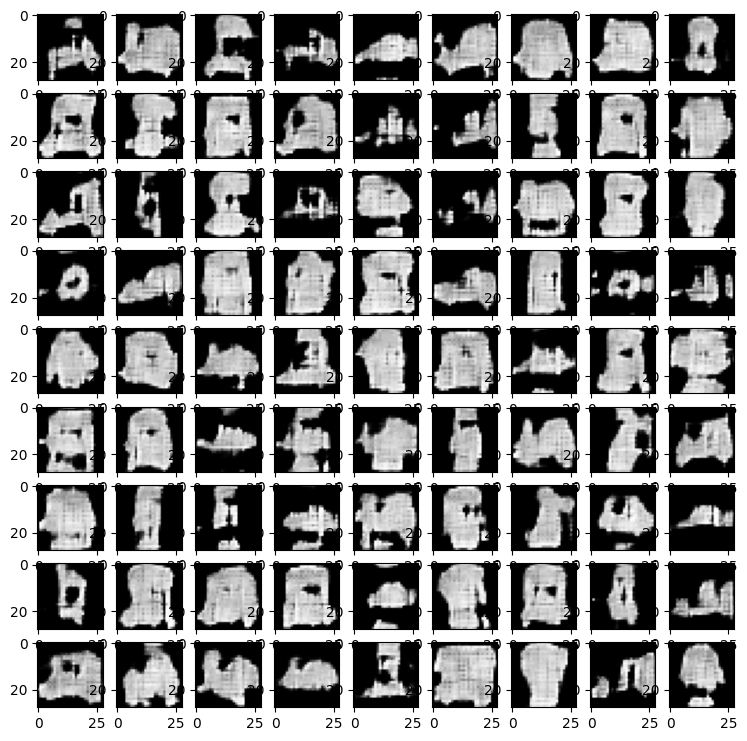

E:3, Loss G0.6333, Loss D:0.6190,Acc G:% 4.5273, Acc D:%83.15
E:4, Loss G0.6351, Loss D:0.6109,Acc G:% 4.6079, Acc D:%82.67


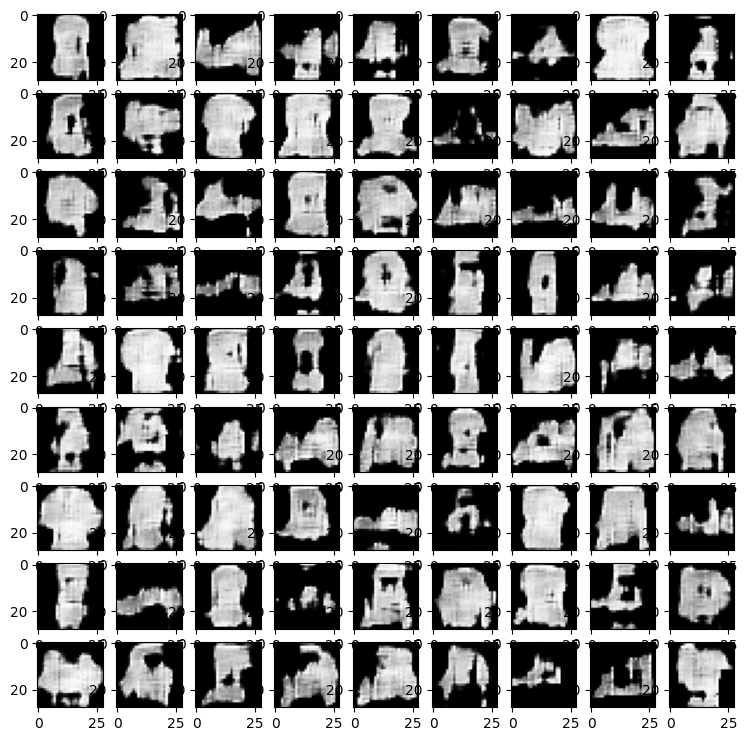

E:5, Loss G0.6351, Loss D:0.6076,Acc G:% 4.6756, Acc D:%82.37
E:6, Loss G0.6363, Loss D:0.6116,Acc G:% 4.7506, Acc D:%82.08


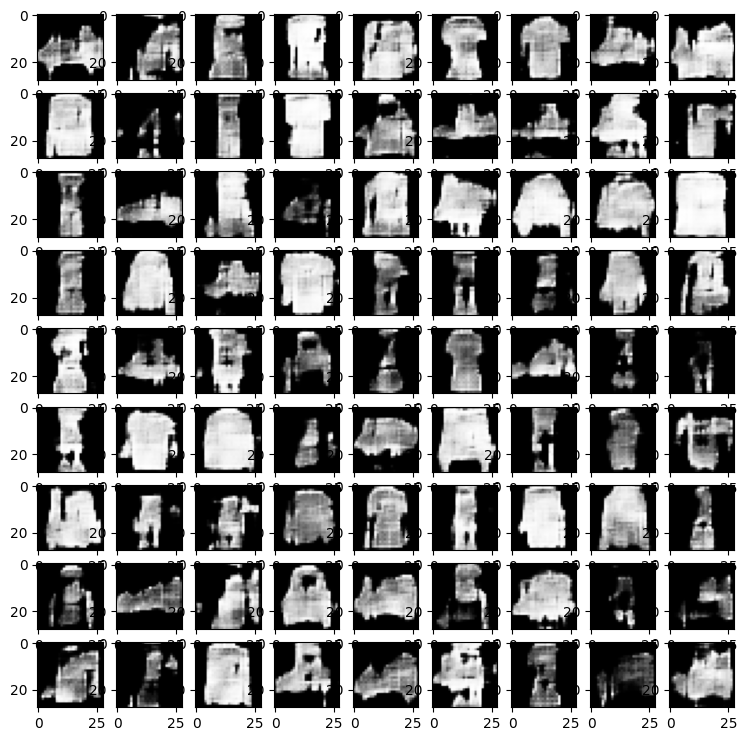

E:7, Loss G0.6369, Loss D:0.6121,Acc G:% 4.8347, Acc D:%81.75
E:8, Loss G0.6372, Loss D:0.6105,Acc G:% 4.9145, Acc D:%81.46


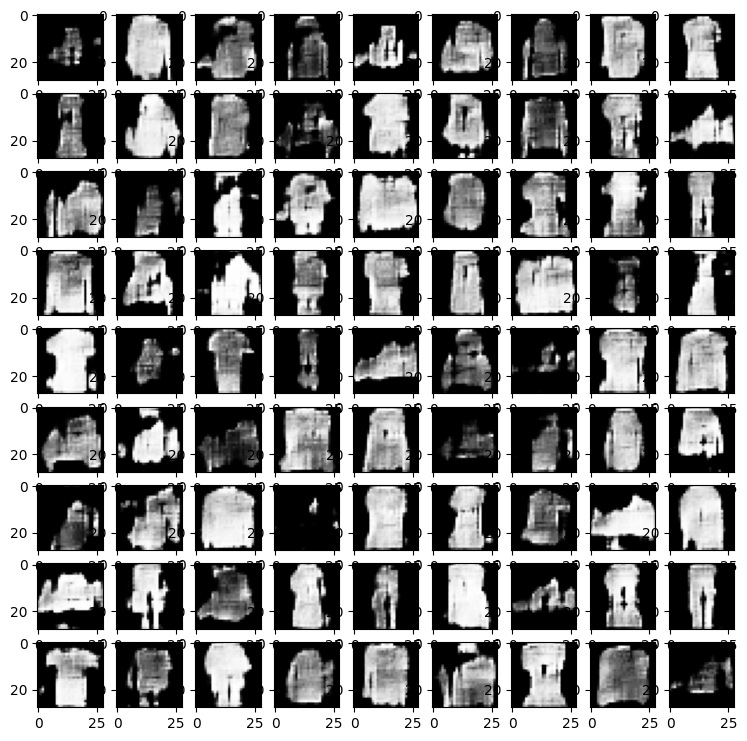

E:9, Loss G0.6373, Loss D:0.6113,Acc G:% 4.9735, Acc D:%81.21
E:10, Loss G0.6373, Loss D:0.6105,Acc G:% 5.0284, Acc D:%80.97


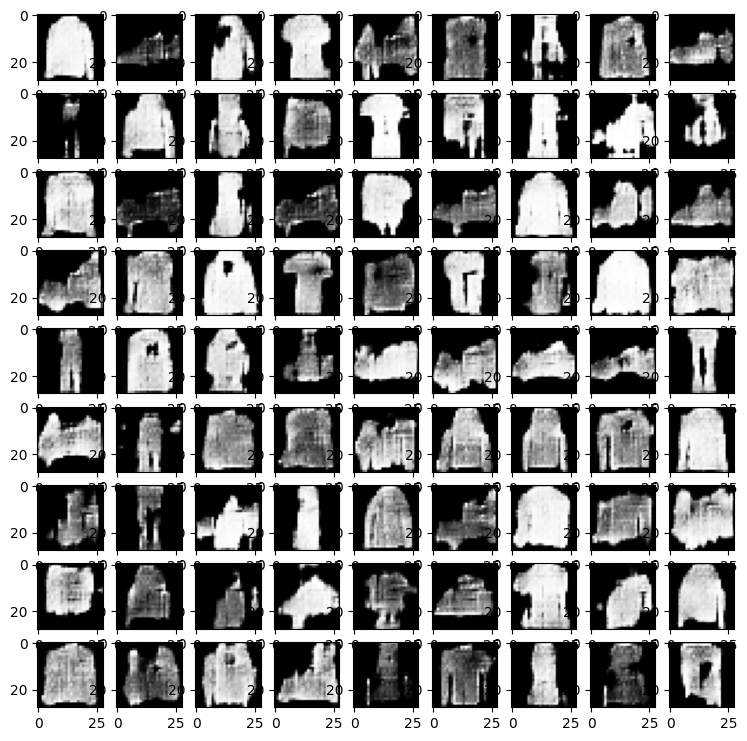

E:11, Loss G0.6384, Loss D:0.6093,Acc G:% 5.0754, Acc D:%80.76
E:12, Loss G0.6400, Loss D:0.6097,Acc G:% 5.0922, Acc D:%80.57


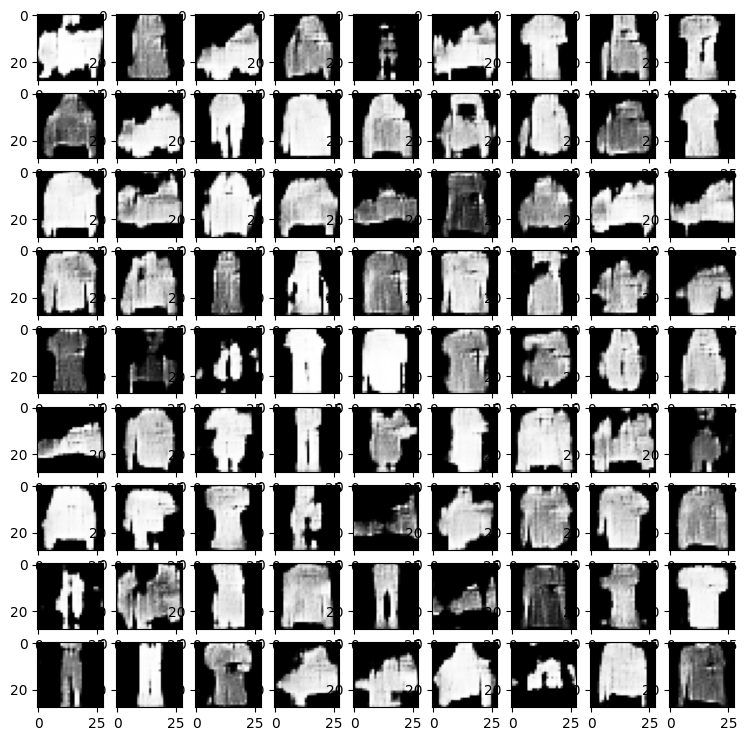

E:13, Loss G0.6412, Loss D:0.6094,Acc G:% 5.1011, Acc D:%80.38
E:14, Loss G0.6421, Loss D:0.6102,Acc G:% 5.1009, Acc D:%80.19


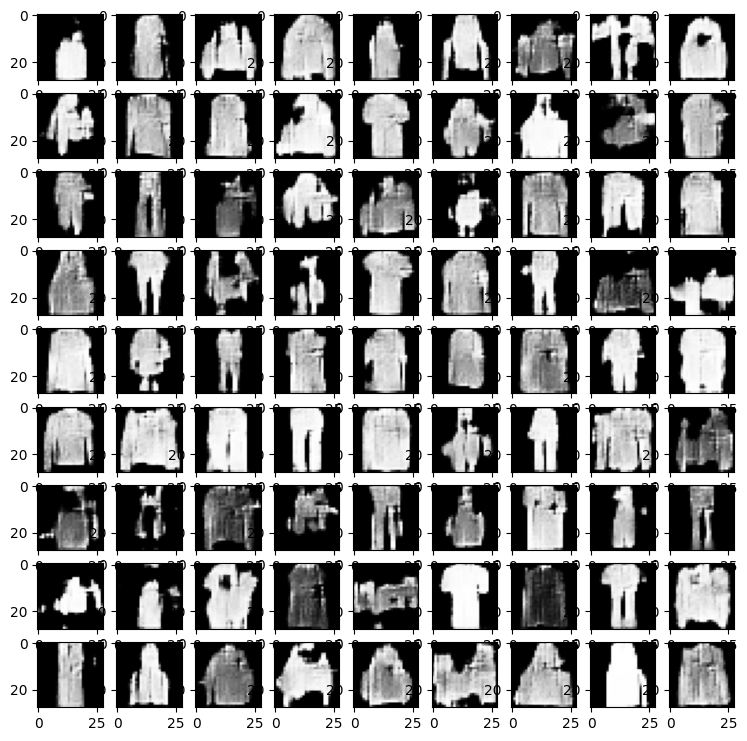

E:15, Loss G0.6430, Loss D:0.6108,Acc G:% 5.0974, Acc D:%79.99
E:16, Loss G0.6459, Loss D:0.6123,Acc G:% 5.0798, Acc D:%79.79


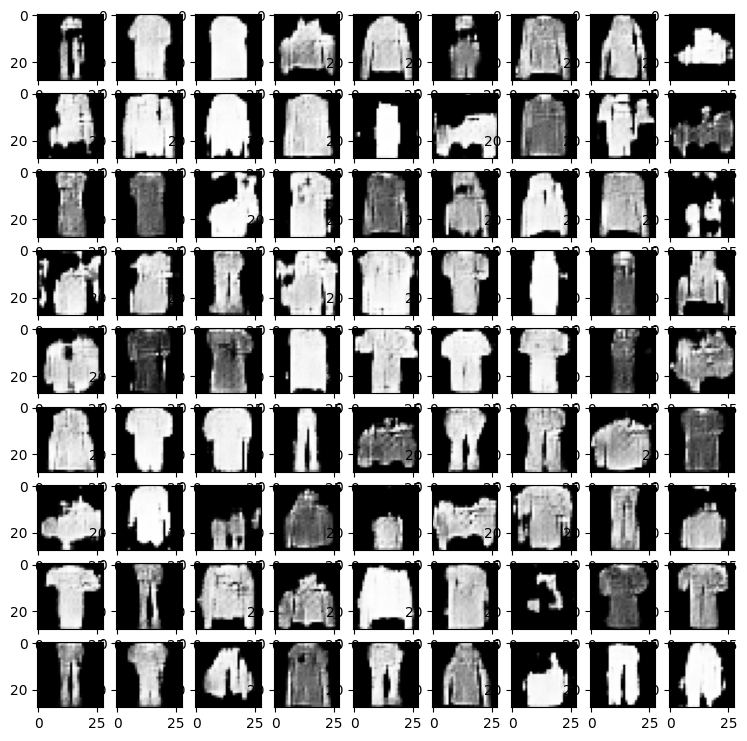

E:17, Loss G0.6460, Loss D:0.6117,Acc G:% 5.0581, Acc D:%79.58
E:18, Loss G0.6484, Loss D:0.6113,Acc G:% 5.0312, Acc D:%79.39


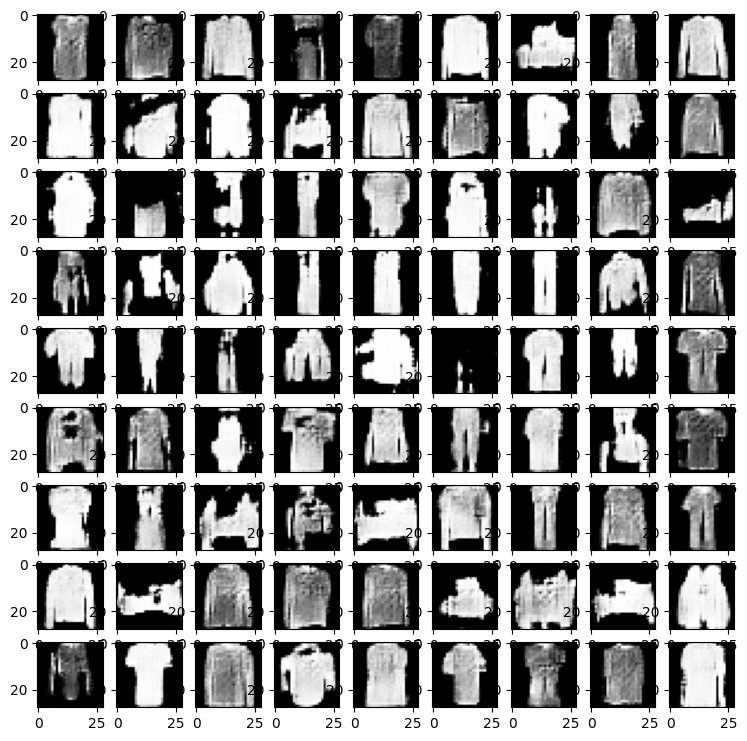

E:19, Loss G0.6498, Loss D:0.6110,Acc G:% 4.9945, Acc D:%79.22
E:20, Loss G0.6510, Loss D:0.6106,Acc G:% 4.9550, Acc D:%79.05


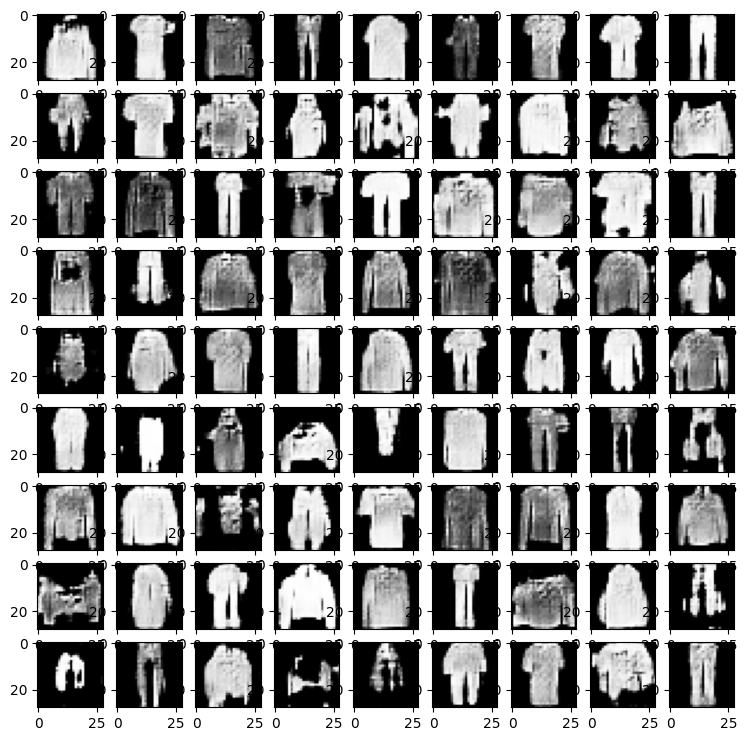

E:21, Loss G0.6517, Loss D:0.6108,Acc G:% 4.9136, Acc D:%78.90
E:22, Loss G0.6528, Loss D:0.6119,Acc G:% 4.8690, Acc D:%78.74


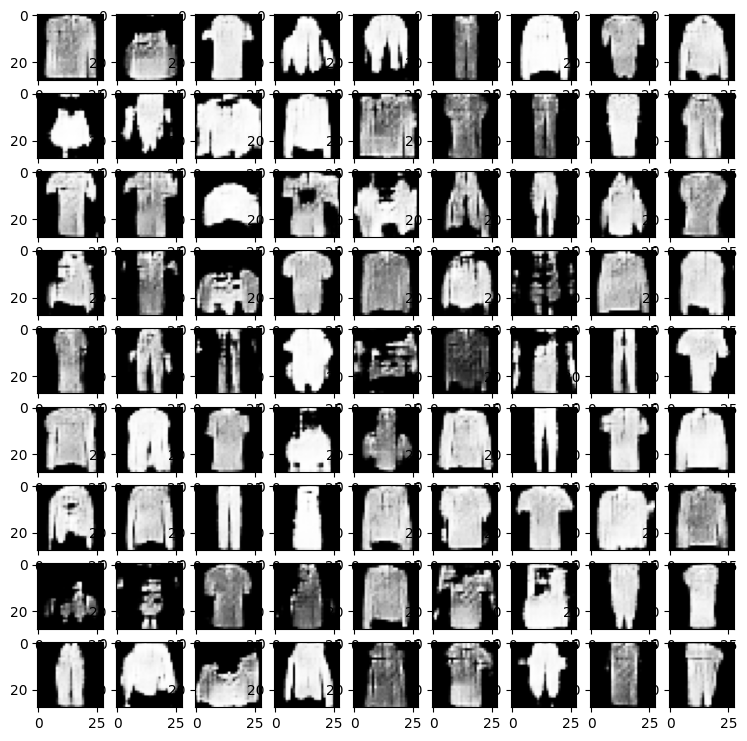

E:23, Loss G0.6525, Loss D:0.6121,Acc G:% 4.8325, Acc D:%78.59
E:24, Loss G0.6507, Loss D:0.6109,Acc G:% 4.7995, Acc D:%78.45


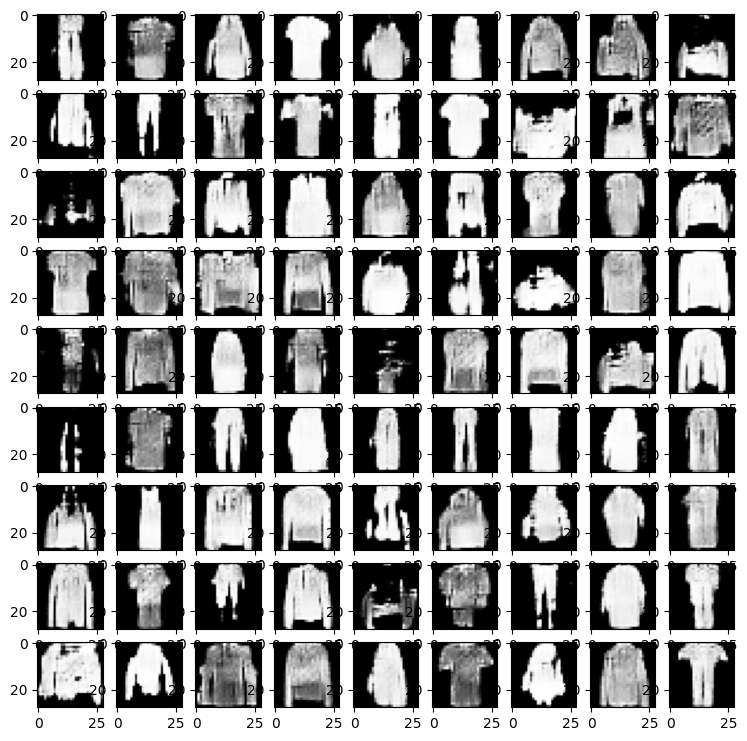

execution time is: 2536.9647347927094 seconds


In [32]:
# Training the Discrimintor and Generator with cross-entropy-loss : low training
import time
start_time = time.time()
Acc1 = []
for epoch in range(25):
    dLossSum = 0
    gLossSum = 0
    dAccSum = 0
    gAccSum = 0
    cnt=0
    for batch in dataset:
        dLoss = trainDstep(batch,discriminator,generator,optimizerD)
        dLossSum += dLoss['discriminator_loss']
        dAccSum += dLoss['discriminator_accuracy']

        gLoss = trainGstep(batch,discriminator,generator,optimizerG)
        #Loss1.append(gLoss['generator_loss'].numpy().item())
        gLossSum += gLoss['generator_loss']
        gAccSum += gLoss['generator_accuracy']

        cnt += 1
    print("E:{}, Loss G{:0.4f}, Loss D:{:0.4f},Acc G:% {:0.4f}, Acc D:%{:0.2f}".format(
    epoch,
    gLossSum/cnt,
    dLossSum/cnt,
    100* gAccSum/cnt,
    100* dAccSum/cnt))
    Acc1.append((100* dAccSum/cnt).numpy())

    if epoch % 2 == 0:
        plotImages(generator)
end_time = time.time()

# Calculate the elapsed time
elapsed_time = end_time - start_time
print("execution time is:", elapsed_time,"seconds")

E:0, Loss G1.6778, Loss D:0.6191, Acc D:%78.46


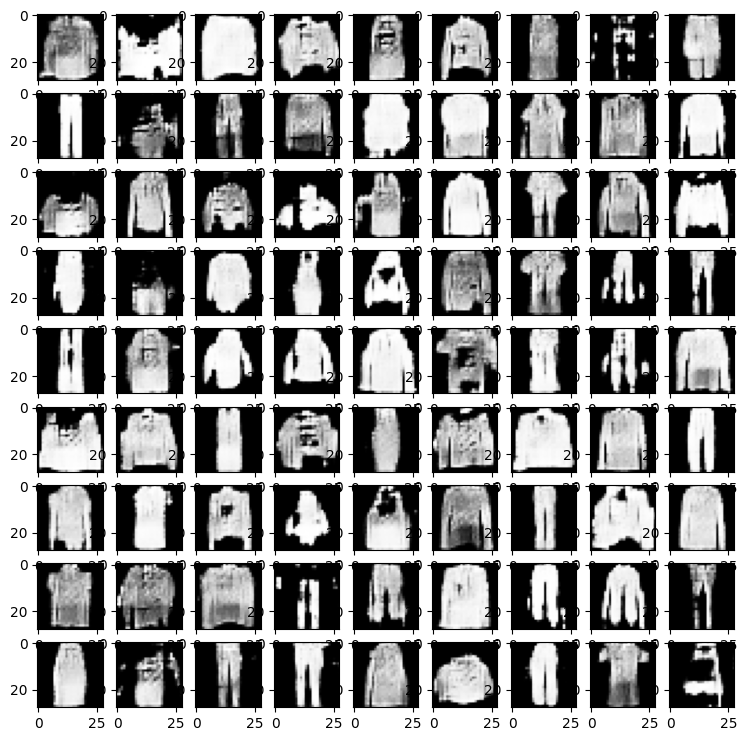

E:1, Loss G2.2708, Loss D:0.6053, Acc D:%78.56
E:2, Loss G2.7416, Loss D:0.5749, Acc D:%78.72


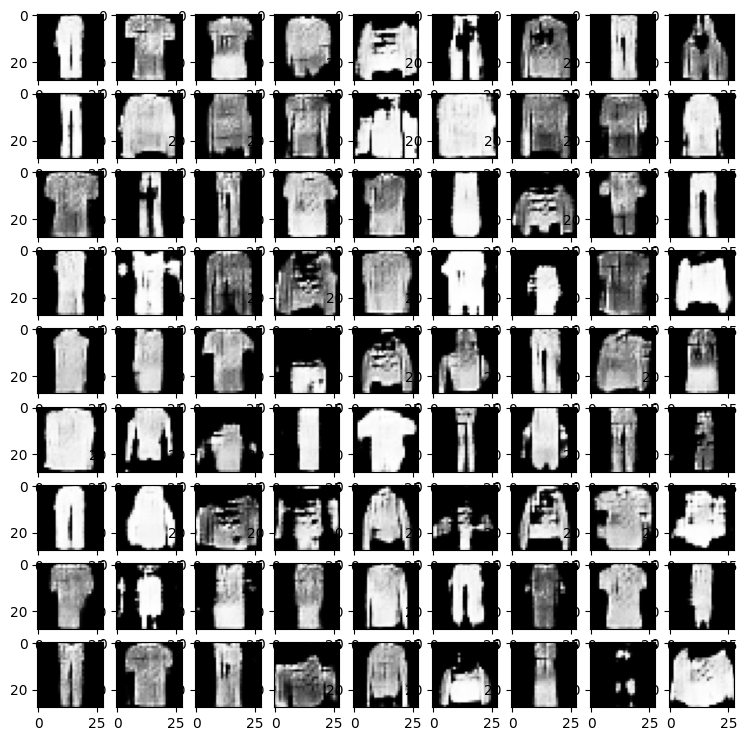

E:3, Loss G3.0873, Loss D:0.5628, Acc D:%79.02
E:4, Loss G4.6420, Loss D:0.6590, Acc D:%78.99


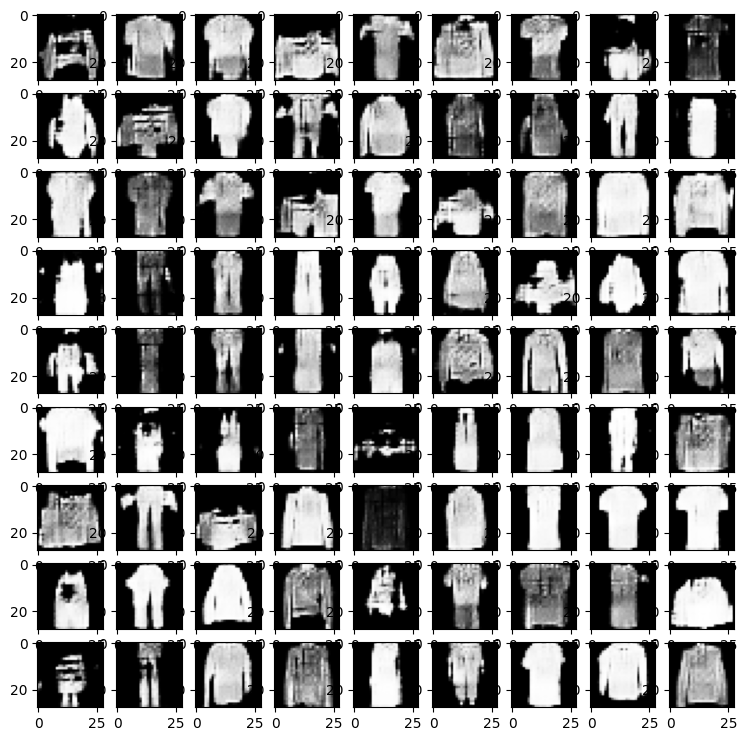

E:5, Loss G10.0270, Loss D:0.6932, Acc D:%78.36
E:6, Loss G10.6286, Loss D:0.6932, Acc D:%77.69


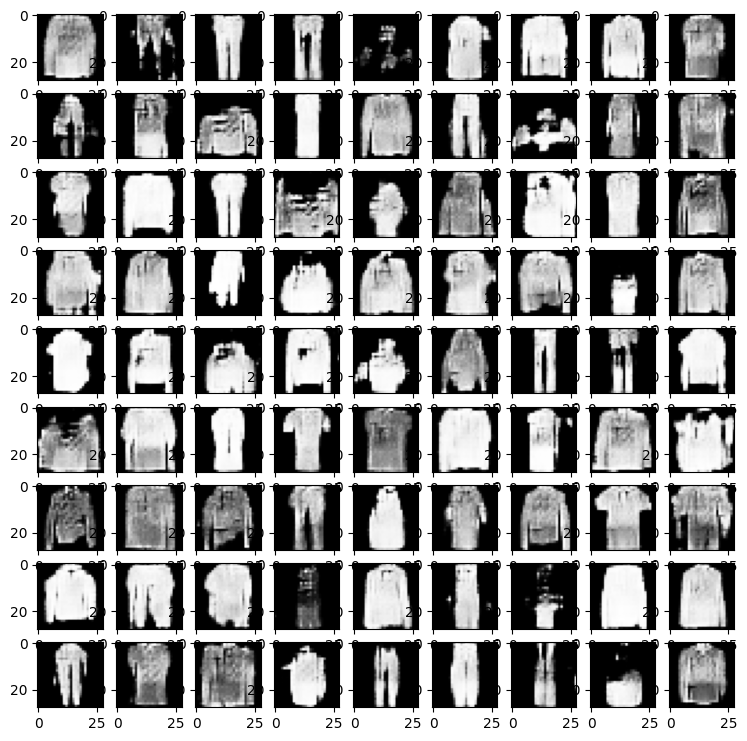

E:7, Loss G10.9887, Loss D:0.6932, Acc D:%77.04
E:8, Loss G11.8152, Loss D:0.6932, Acc D:%76.43


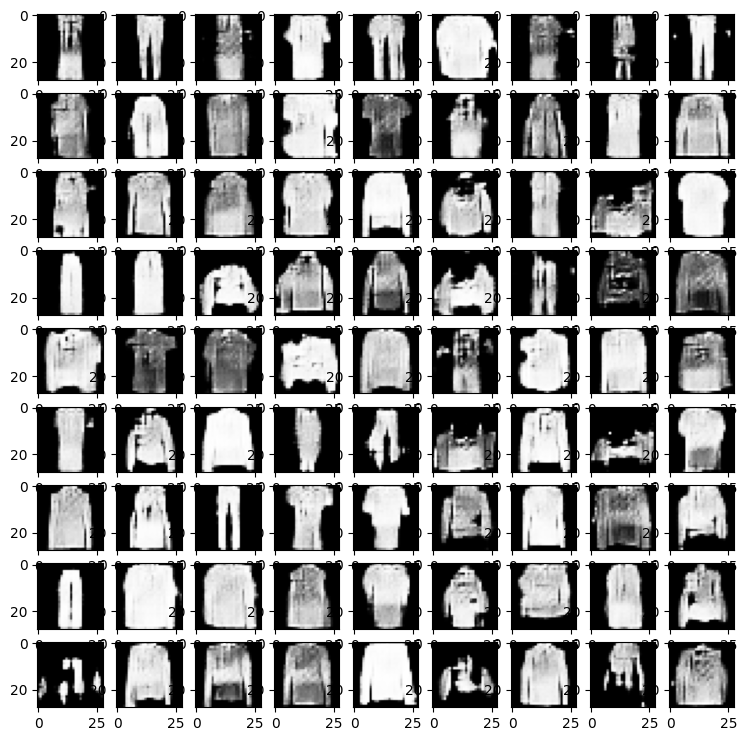

E:9, Loss G12.1793, Loss D:0.6932, Acc D:%75.84
E:10, Loss G13.0747, Loss D:0.6932, Acc D:%75.28


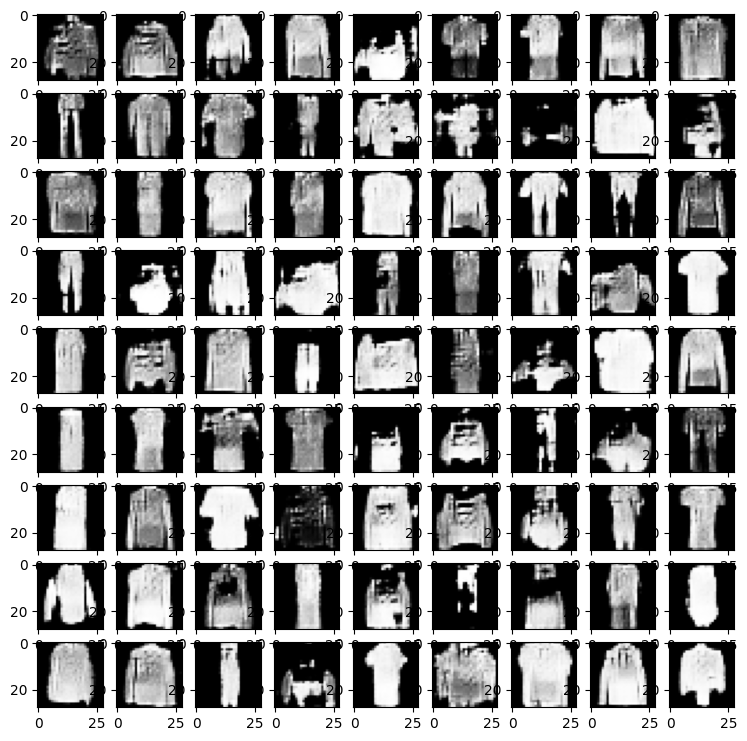

E:11, Loss G13.9745, Loss D:0.6932, Acc D:%74.74
E:12, Loss G14.6699, Loss D:0.6932, Acc D:%74.22


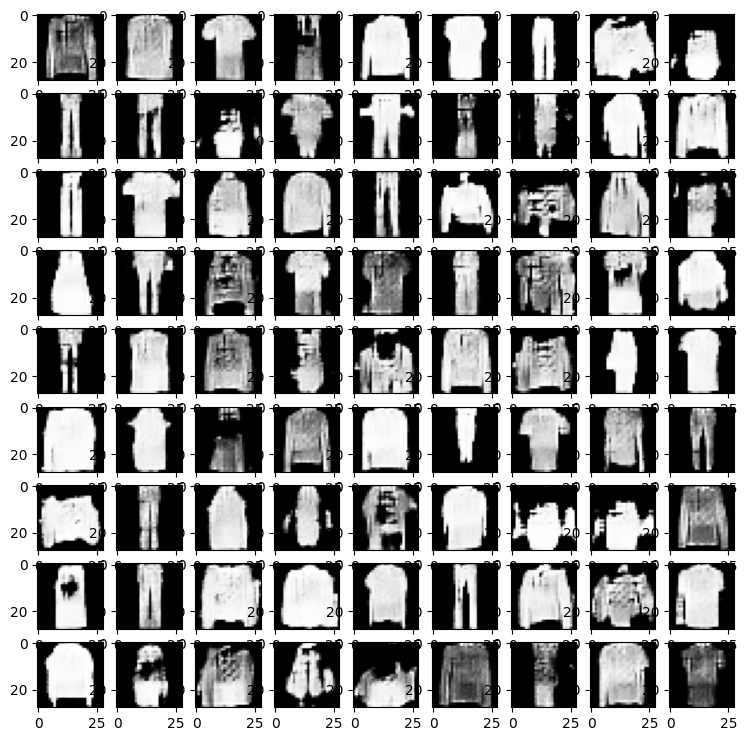

E:13, Loss G15.2857, Loss D:0.6932, Acc D:%73.73
E:14, Loss G15.8739, Loss D:0.6932, Acc D:%73.25


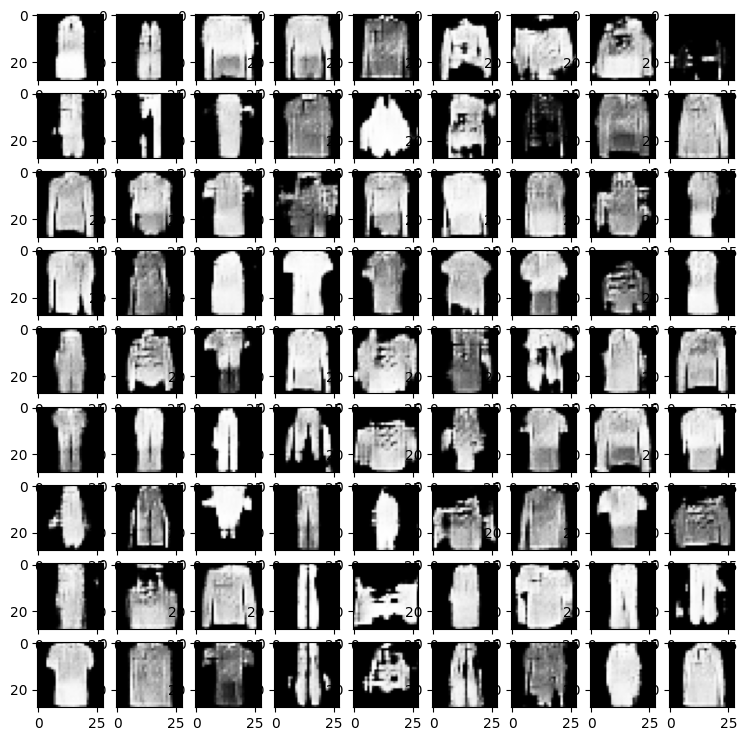

E:15, Loss G16.4296, Loss D:0.6932, Acc D:%72.79
E:16, Loss G16.9586, Loss D:0.6932, Acc D:%72.36


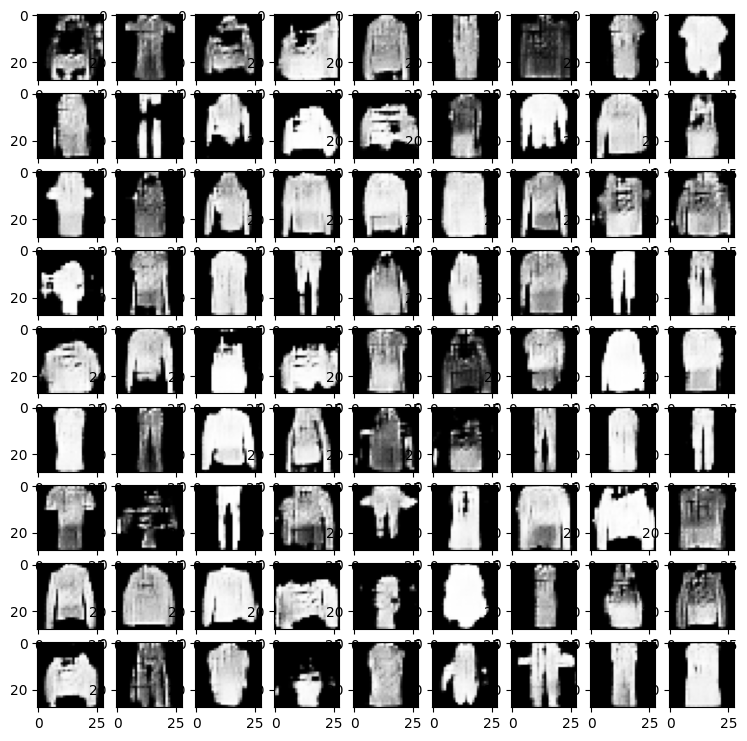

E:17, Loss G17.4295, Loss D:0.6932, Acc D:%71.93
E:18, Loss G17.7728, Loss D:0.6932, Acc D:%71.53


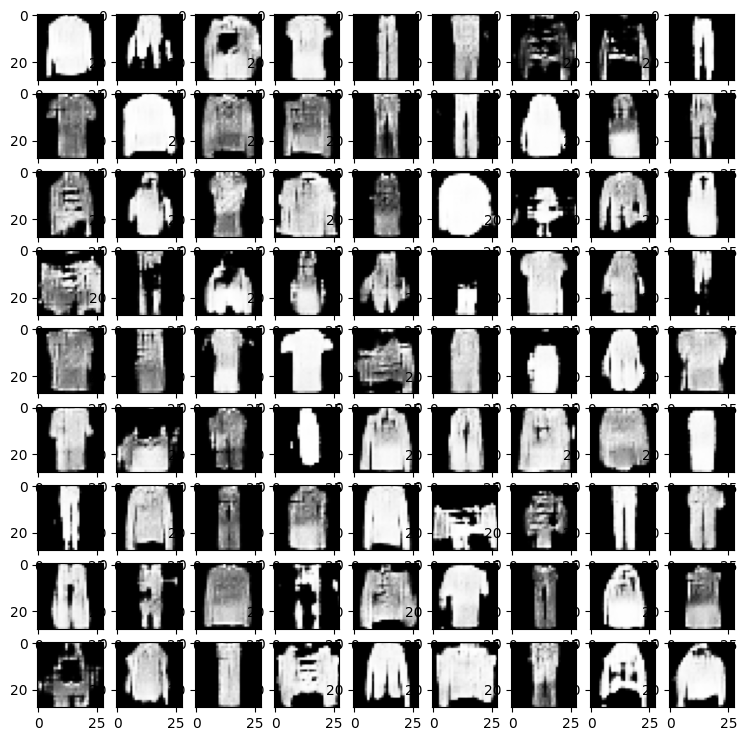

E:19, Loss G17.6006, Loss D:0.6932, Acc D:%71.13
E:20, Loss G17.8541, Loss D:0.6932, Acc D:%70.76


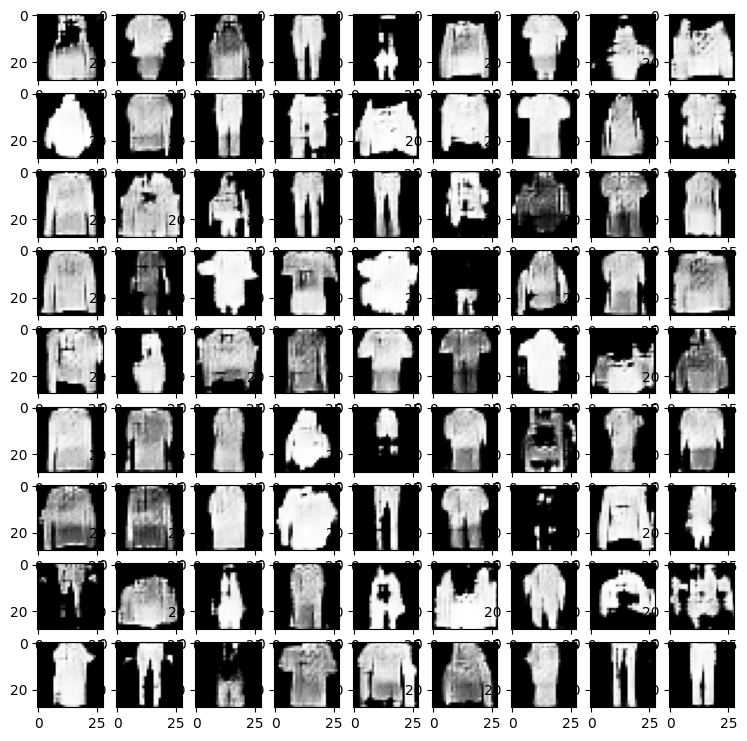

E:21, Loss G18.1641, Loss D:0.6932, Acc D:%70.39
E:22, Loss G18.4987, Loss D:0.6932, Acc D:%70.04


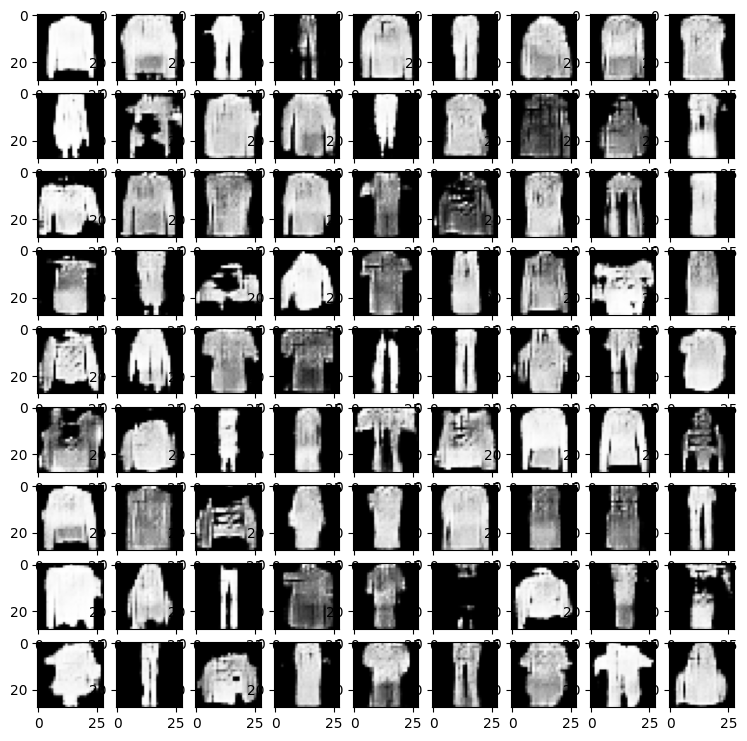

E:23, Loss G18.8503, Loss D:0.6932, Acc D:%69.70
E:24, Loss G19.2100, Loss D:0.6932, Acc D:%69.37


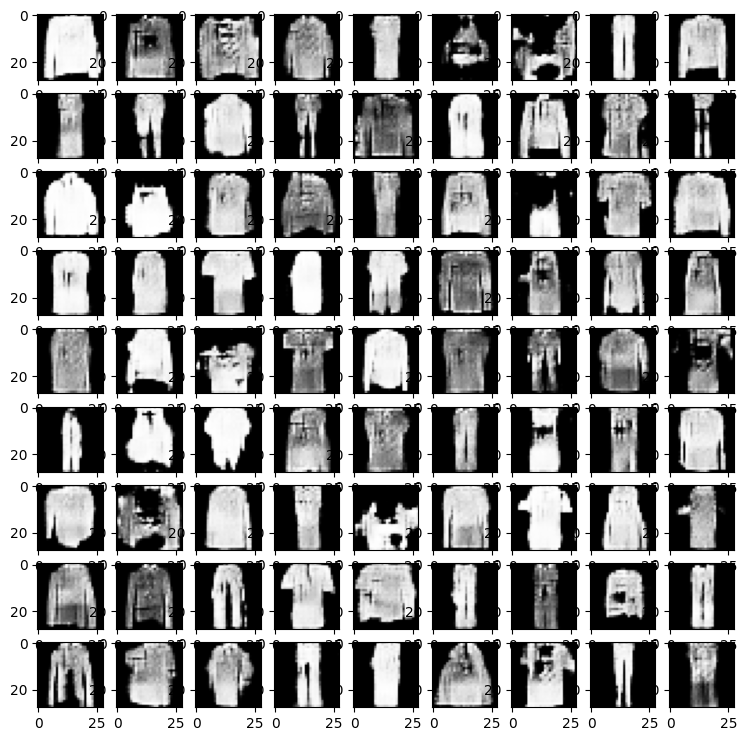

execution time is: 1915.9198293685913 seconds


In [37]:
# Training  Generator with non saturating cost function : -mean(log(D(G(x))))
import time
start_time = time.time()
Acc2 = []
for layer in discriminator_clone.layers:
    layer.trainable = True
for layer in generator_clone.layers:
    layer.trainable = True

for epoch in range(25):
    dLossSum = 0
    gLossSum = 0
    dAccSum = 0
    gAccSum = 0
    cnt=0
    for batch in dataset:
        dLoss = trainDstep(batch,discriminator_clone,generator_clone,optimizerD1)
        dLossSum += dLoss['discriminator_loss']
        dAccSum += dLoss['discriminator_accuracy']

        gLoss = trainGstep1(batch,discriminator_clone,generator_clone,optimizerG1)
        #Loss2.append(gLoss['generator_loss'].numpy().item())
        gLossSum += gLoss['generator_loss']


        cnt += 1

    print("E:{}, Loss G{:0.4f}, Loss D:{:0.4f}, Acc D:%{:0.2f}".format(
    epoch,
    gLossSum/cnt,
    dLossSum/cnt,
    100* dAccSum/cnt))
    Acc2.append((100* dAccSum/cnt).numpy())


    if epoch % 2 == 0:
        plotImages(generator)
end_time = time.time()

# Calculate the elapsed time
elapsed_time = end_time - start_time
print("execution time is:", elapsed_time,"seconds")

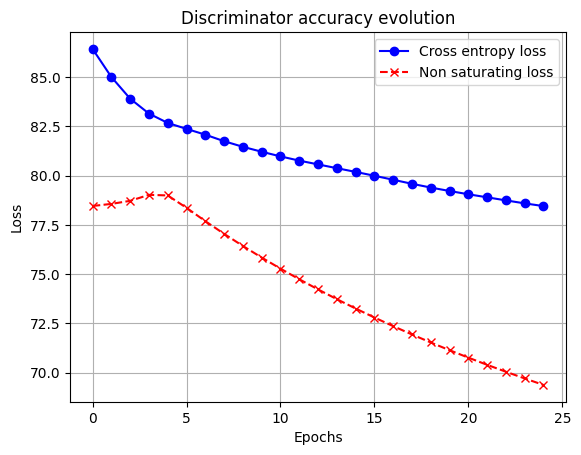

In [39]:
# plotting evolution of Discriminator accuracy with the 2 version of the loss function

epochs = list(range(0, 25))

# Plotting
plt.plot(epochs, Acc1, marker='o', linestyle='-', color='b', label='Cross entropy loss')
plt.plot(epochs, Acc2, marker='x', linestyle='--', color='r', label='Non saturating loss')

# Add labels and legend
plt.title('Discriminator accuracy evolution')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# Display the grid
plt.grid(True)

# Show the plot
plt.show()

**The Discriminator accuracy tends quickly to 1/2 when using the Non saturating loss to optimize the generator weights. that means that the generator in this case learn to fool the discriminatorn better as the discriminator tends quickly to guess randomly the output**

25